In [248]:
import pandas as pd
import numpy as np
import talib
import os
import re
import seaborn as sns
import xgboost as xgb
from pandas import DataFrame
import matplotlib.pyplot as plt
from scipy import stats
import math
from sklearn.linear_model import LinearRegression
from sklearn import model_selection
from sklearn.linear_model import Lasso
from keras.models import Sequential
from keras import layers
import keras
from keras.models import Model
from keras.layers import LSTM, Dense, Dropout, Embedding, Input, Masking, GlobalAveragePooling1D
from keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

import scipy.optimize as sco

import warnings
warnings.filterwarnings('ignore')

In [249]:
def explore_dataset(file: str) -> dict:
    """
    Load a dataset and perform preliminary exploration.

    Parameters:
    - file (str): The name of the file containing the dataset.

    Returns:
    - dict: A summary of the dataset exploration.
    """
    
    # Load the dataset
    if file.endswith(".zip"):
        df = pd.read_csv(file, compression='zip', header=0, sep=',', quotechar='"')
    else:
        df = pd.read_csv(file)
        
    # Load security reference data
    sec_ref_1 = pd.read_csv('security_reference_data_w_ret1d_1.csv')
    sec_ref_2 = pd.read_csv('security_reference_data_w_ret1d_2.csv')
    
    # Combine the security reference datasets
    sec_ref = pd.concat([sec_ref_1, sec_ref_2], ignore_index=True)

    # Merge the dataset with security reference data based on 'data_date' and 'security_id'
    df = df.merge(sec_ref, on=['data_date', 'security_id'], how='left')
    
    # Convert data_date from int to datetime format
    df['data_date'] = df['data_date'].astype(str)
    df['data_date'] = pd.to_datetime(df['data_date'], format='%Y%m%d')

    # Calculate the time difference between two consecutive non-NA values for each security_id
    def average_difference(series):
        non_na_dates = series.dropna().sort_values()
        return non_na_dates.diff().mean()
    
    avg_diff_per_id = df.groupby('security_id').apply(lambda x: average_difference(x['data_date']))
    
    # Calculate the overall average frequency
    overall_avg_frequency = avg_diff_per_id.mean().days
    
    # Check the length of the data
    data_length = len(df)
    
    # Average number of IDs per day
    avg_ids_per_day = df.groupby('data_date')['security_id'].nunique().mean()
    
    # Count missing values for the value column
    na_count = 100*df.iloc[:, 2].isna().sum()/data_length

    # Get the time span the dataset covers
    time_span_start = df['data_date'].min()
    time_span_end = df['data_date'].max()
    
    # Get the total number of unique security_ids
    unique_ids = df['security_id'].nunique()
    
    # Count the number of tradable securities
    tradable_count = df[df['in_trading_universe'] == 'Y']['security_id'].nunique()

    # Summarize findings
    summary = {
        "File": file,
        "Average Data Frequency (days)": overall_avg_frequency,
        "Data Length": data_length,
        "Avg IDs/Day": avg_ids_per_day,
        "NA Count(%)": na_count,
        "Time Span Start": time_span_start,
        "Time Span End": time_span_end,
        "Total Unique IDs": unique_ids,
        "Tradable Unique IDs": tradable_count
    }
    
    return summary

In [250]:
files = [x for x in os.listdir() if 'data_set' in x]
files_sorted = sorted(files, key=lambda x: int(re.search(r'data_set_(\d+)', x).group(1)))
summaries = [explore_dataset(file) for file in files_sorted]
summary_df = pd.DataFrame(summaries)

In [251]:
summary_df

,File,Average Data Frequency (days),Data Length,Avg IDs/Day,NA Count(%),Time Span Start,Time Span End,Total Unique IDs,Tradable Unique IDs
0,data_set_1.csv,102,127266,63.888554,3.762199,2010-01-04,2017-12-29,6522,3520
1,data_set_2.csv,102,127266,63.888554,11.500322,2010-01-04,2017-12-29,6522,3520
2,data_set_3.csv,46,254532,63.888554,21.477064,2010-01-04,2017-12-29,6522,3520
3,data_set_4.csv,46,254532,63.888554,3.671837,2010-01-04,2017-12-29,6522,3520
4,data_set_5.csv,102,127266,63.888554,11.835840,2010-01-04,2017-12-29,6522,3520
5,data_set_6.csv,102,127266,63.888554,19.638395,2010-01-04,2017-12-29,6522,3520
6,data_set_7.csv,102,127266,63.888554,18.957145,2010-01-04,2017-12-29,6522,3520
7,data_set_8.zip,2,8345449,4012.235096,0.000000,2010-01-04,2017-12-29,7068,3841
8,data_set_9.zip,2,16176736,4053.405365,0.000000,2010-01-04,2017-12-29,7373,3719
9,data_set_10.csv,1,3281273,1630.041232,0.000000,2010-01-04,2017-12-29,3084,2219


In [252]:
def merge_datasets(files: list) -> pd.DataFrame:
    """
    Merge multiple datasets into one dataframe based on 'data_date' and 'security_id'.
    
    Parameters:
    - files (list): List of file names to merge.
    
    Returns:
    - pd.DataFrame: A merged dataframe.
    """
    dfs = []

    # Sort files by the dataset number
    files_sorted = sorted(files, key=lambda x: int(re.search(r'data_set_(\d+)', x).group(1)))

    # Load and rename columns
    for file in files_sorted:
        # Extract the dataset number from the file name
        num = file.split('_')[2].split('.')[0]

        # For zip files, use the `compression` parameter
        compression = 'zip' if file.endswith('.zip') else None

        # Load the dataset
        df = pd.read_csv(file, compression=compression)
        df['data_date'] = pd.to_datetime(df['data_date'].apply(str))
        # Solve the question the same day and smae id has two different values, we take the mean
        df = df.groupby(['data_date', 'security_id']).mean().drop_duplicates()
        dfs.append(df)

    # Merge all the dataframes
    merged_df = pd.concat(dfs,axis=1,join = 'outer').reset_index()
    ## First fill the NA by the forward value of the same id
    merged_df = merged_df.groupby('security_id').apply(lambda group: group.sort_values(by='data_date').ffill()).reset_index(drop=True)
    ## Second fill the NA by the mean value of the same date
    merged_df = merged_df.groupby('data_date').apply(lambda group: group.fillna(group.mean())).reset_index(drop=True)

    sec_ref_1 = pd.read_csv('security_reference_data_w_ret1d_1.csv')
    sec_ref_2 = pd.read_csv('security_reference_data_w_ret1d_2.csv')
    sec_ref = pd.concat([sec_ref_1,sec_ref_2])
    
    ## Clear out the extrme return that greater than 1
    sec_ref = sec_ref[sec_ref['ret1d']<=1]
    
    ## Calculate Excess Return 
    def handle(x):
        x['excess_ret1d'] = x['ret1d'] - x['ret1d'].mean()
        return x.set_index('security_id')[x.columns.difference(['data_date','security_id'])]
    sec_ref = sec_ref.groupby('data_date').apply(lambda x:handle(x)).reset_index()
    sec_ref['data_date'] = pd.to_datetime(sec_ref['data_date'].apply(str))
    
    merged_df = pd.merge(merged_df,sec_ref,on=['data_date', 'security_id'],how='left')
    
    return merged_df.dropna()

In [253]:
files = [x for x in os.listdir() if 'data_set' in x]
merged_df = merge_datasets(files)

<Axes: xlabel='data_date'>

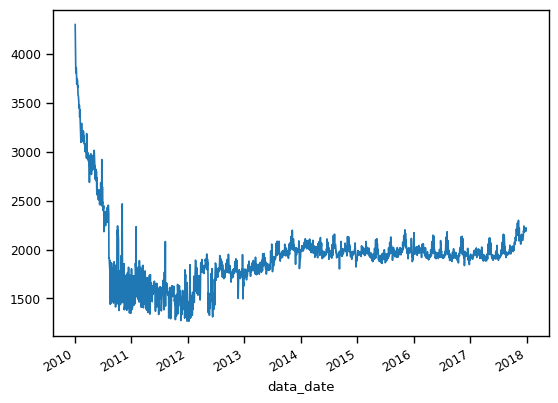

In [254]:
merged_df.groupby(['data_date']).count().iloc[:,0].plot()

In [255]:
def compute_factors(data):
    # Sorting the dataframe by security_id and date
    data = data.sort_values(by=['security_id', 'data_date'])

    # List to store dataframes after processing each security's data
    dfs = []

    for security, df in data.groupby('security_id'):
        
        df = df.sort_values(by='data_date')
        
        # 1. Moving Average
        for i in range(6,51,4):
            df[f'SMA_{i}'] = talib.SMA(df['close_price'], timeperiod=i)

        # 2. EMA - Exponential Moving Average
        for i in range(6,51,4):
            df[f'EMA_{i}'] = talib.EMA(df['close_price'], timeperiod=i)

        # 3. VWMA - Volume Weighted Moving Average
        vol_price = df['volume'] * df['close_price']
        for i in range(6,51,4):
            df[f'VSMA_{i}'] = talib.SMA(vol_price, timeperiod=i)

        # 4. BBANDS - Bollinger Bands with different timeperiod
        for i in range(14,61,6):
            upper, middle, lower = talib.BBANDS(df['close_price'], timeperiod=i)
            df[f'BBANDS_upper_{i}'] = upper
            df[f'BBANDS_middle_{i}'] = middle
            df[f'BBANDS_lower_{i}'] = lower

        # 5. MOM - Momentum
        for i in range(14,61,6):
            df[f'MOM_{i}'] = talib.MOM(df['close_price'], timeperiod=i)


        # 6. Acceleration - Difference in the change of momentum
        for i in range(14,61,6):
            df[f'ACCEL_{i}'] = df[f'MOM_{i}'].diff()


        # 7. Rate of Change - Rate change of Price
        for i in range(14,61,6):
            df[f'ROCR_{i}'] = df['close_price'].pct_change(i)

        # 6. Moving Average Convergence Divergence
        for i in [18,24,30]:
            macd, macdsignal, macdhist = talib.MACD(df['close_price'], fastperiod=12, slowperiod=i)
            df[f'MACD_12_{i}'] = macd

        # 7. RSI
        for i in [8,14,20]:
            df[f'RSI_{i}'] = talib.RSI(df['close_price'], timeperiod=i)

        # 8. Price Volume Trend
        df['PVT'] = df['volume'] * (df['close_price'].pct_change())

        # 9. OBV - On Balance Volume
        df['OBV'] = talib.OBV(df['close_price'], df['volume'])

        # 10.Psychological Line Indicator
        df['PSY'] =(df['close_price'] > df['close_price'].shift(1)).rolling(window=14).sum() / 14 * 100
        
        
        #11.Create volatility by rolling 3, 5, 15 days
        ret = df['close_price'].pct_change()
        for i in [3,5,15]:
            df[f'sd_{i}'] = ret.rolling(window = i).std()

        df['sd5_15'] = df['sd_5']/df['sd_15']
    
        #12. Create 5, 15 days moving volume volatility
        for i in [3,5,15]:
            df[f'volsd_{i}'] = df['volume'].rolling(window = i).std()
            
        df['volsd5_15'] = df['volsd_5']/df['volsd_15']
    
        #13. Correlation between 
        df['vol_change'] = df['volume'].pct_change()
        for i in [5,15]:
            df[f'corr_{i}'] = ret.rolling(i).corr(df['vol_change'])

        ## Predict return label(futurn 1day excess return)
        df['target'] = df['excess_ret1d'].shift(-1)
        df['tmr_ret1d'] = df['ret1d'].shift(-1)
        
        
        # Append the processed data to our list
        dfs.append(df)


    # Concatenate all the processed dataframes together
    final_df = pd.concat(dfs, ignore_index=True)
    
    return final_df.dropna()

In [256]:
all_df = compute_factors(merged_df)

In [257]:
all_df = all_df.set_index(['data_date','security_id']).sort_index()

<Axes: xlabel='ret1d', ylabel='Count'>

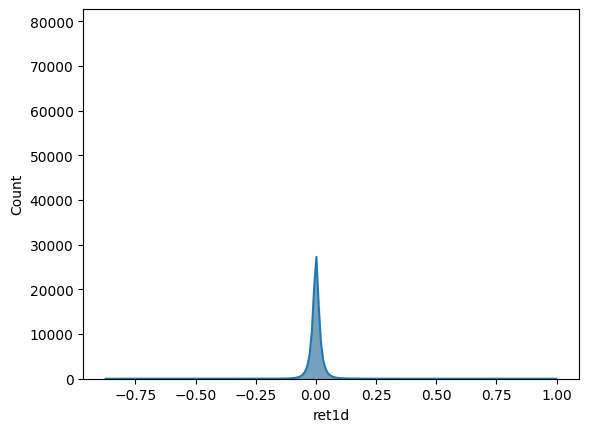

In [18]:
sns.histplot(x="ret1d", data=all_df,kde=True)

In [19]:
all_df

d1           d2        d3        d4   
data_date  security_id                                                 
2010-03-26 78001          30.762000   142.204000  0.129845  6.928100  \
           82901       -2319.518954  -904.869647  0.107223  2.908438   
           90201         -16.292000    83.735000  0.072284  5.705700   
           97801        1758.000000  6161.000000  0.107223  2.908438   
           102501       -430.000000  -299.000000 -0.010582  8.030600   
...                             ...          ...       ...       ...   
2017-12-28 1117461801   -110.440000   556.927809 -0.001726  0.757886   
           1117488501    171.647090   556.927809 -0.001726  0.757886   
           1117489101    171.647090   556.927809 -0.001726  0.757886   
           1117496301    171.647090   556.927809 -0.001726  0.757886   
           1117509701     15.078000   556.927809 -0.001726  0.757886   

                              d5        d6        d7            d8         d9   
data_date  security_id                                                          
2010-03-26 78001        0.022079 -0.095300 -0.439951  8.540530e+05  18.245000  \
           82901        0.035848 -0.367626 -0.439951  4.029420e+05  15.780000   
           90201        0.019169 -0.367626 -0.060600  5.209300e+05  26.520000   
           97801        0.035848 -0.367626 -0.439951  3.686650e+06   1.590000   
           102501       0.021623 -0.367626 -0.065900  7.158550e+06   4.495000   
...                          ...       ...       ...           ...        ...   
2017-12-28 1117461801  -0.013912  3.200307  0.390449  7.641460e+05  30.157816   
           1117488501   0.001218  3.200307  0.390449  1.373518e+06  30.157816   
           1117489101  -0.006506  3.200307  0.390449  8.463990e+05  30.157816   
           1117496301   0.031794  3.200307  0.390449  5.375240e+05  30.157816   
           1117509701   0.002994  3.200307  0.390449  7.863540e+05  30.157816   

                                d10  ...     sd_15    sd5_15       volsd_3   
data_date  security_id               ...                                     
2010-03-26 78001         248.000000  ...  0.021595  1.238737  3.537960e+05  \
           82901          10.000000  ...  0.074414  0.509233  2.895380e+04   
           90201          82.000000  ...  0.008395  1.126181  6.798654e+04   
           97801          15.000000  ...  0.010473  0.557360  1.954734e+05   
           102501          2.000000  ...  0.015757  0.848903  3.218910e+06   
...                             ...  ...       ...       ...           ...   
2017-12-28 1117461801   3654.670034  ...  0.013749  1.278992  5.570981e+04   
           1117488501   3654.670034  ...  0.044624  1.427473  1.183664e+05   
           1117489101   3654.670034  ...  0.012930  1.310562  6.522915e+04   
           1117496301   3654.670034  ...  0.045685  0.741610  1.446170e+05   
           1117509701   3654.670034  ...  0.029406  0.619049  7.057387e+04   

                             volsd_5      volsd_15  volsd5_15  vol_change   
data_date  security_id                                                      
2010-03-26 78001        2.637772e+05  2.476972e+05   1.064918    1.885256  \
           82901        4.802079e+05  5.634793e+05   0.852219   -0.019412   
           90201        1.008913e+05  9.168930e+04   1.100361   -0.069190   
           97801        6.570069e+05  5.923066e+05   1.109234   -0.114050   
           102501       2.741156e+06  2.779469e+06   0.986216   -0.423412   
...                              ...           ...        ...         ...   
2017-12-28 1117461801   1.664598e+05  4.494679e+05   0.370349    0.449214   
           1117488501   9.516392e+04  6.746580e+04   1.410551   -0.758311   
           1117489101   3.223958e+05  3.310346e+05   0.973903    0.197240   
           1117496301   2.134998e+05  3.342893e+05   0.638668    1.636756   
           1117509701   5.372787e+04  1.348206e+05   0.398514   -0.046662   

                         

In [20]:
class AlphaSignalAnalyzer:
    def __init__(self, alpha_signal_df: DataFrame, factor_name: str, price_data: DataFrame):
        self.factor_df = alpha_signal_df
        self.factor_df.index.names = ['date','id']
        self.factor_name = factor_name
        
        self.corr_method = 'pearson'
        self.k_layers = 10  # Adjust as needed
        self.portfolio_stock_num = 10  # Adjust as needed
        
        self.return_type = ['return_1','return_2','return_5']
        self.price_data = price_data
        self.price_data.index.names = ['date','id']
        self.price_data = self.price_data.reset_index()

        self.layered_ret_dfs = dict()
        self.ls_ret_dfs = dict()

    def run(self):
        print("-" * 50)
        print("Running analysis...")
        self._add_returns()
        self._calc_sdav_ic()
        for layered_ret_type in self.return_type:
            self._calc_layered_ret(layered_ret_type)
        self._backtest_top_stocks()
        self._gen_report()

    def _add_returns(self):
        print("Adding returns...")
        for i in self.return_type:
            return_data = self.price_data.groupby('id').apply(lambda x:x.set_index('date')['close_price'].pct_change(int(i[-1])).shift(-int(i[-1]))).to_frame(i)
            return_data = return_data[return_data[i]<=1]
            self.factor_df = pd.merge(self.factor_df.reset_index(),return_data.reset_index(),on = ['date','id'],how='left').dropna()
            ## Calculate excess return (demean)
            def handle(x,return_type):
                x[return_type] = x[return_type] - x[return_type].mean()
                return x
            self.factor_df = self.factor_df.groupby('date').apply(lambda x:handle(x,i)).reset_index(drop=True)
            
        self.factor_df = self.factor_df.set_index(['date','id'])
        
        
        
    def _calc_layered_ret(self, layered_ret_type):
        print(f"Calculating layered return of {layered_ret_type}...")
        layered_ret_df = self.factor_df[[self.factor_name, layered_ret_type]].copy().reset_index()
        
        layered_ret_df['layer'] = (layered_ret_df.groupby("date")[self.factor_name].rank(
            pct=True, method='first') * self.k_layers).astype(int) + 1
        layered_ret_df.loc[layered_ret_df.layer > self.k_layers, 'layer'] = self.k_layers
        layered_ret_df = (layered_ret_df.groupby(['date', 'layer'])[layered_ret_type]
                          .mean().unstack().cumsum())

        self.layered_ret_dfs[layered_ret_type] = (layered_ret_df.stack().reset_index()
                                                  .rename(columns={0: layered_ret_type}))
        
        self.ls_ret_dfs[layered_ret_type] = pd.DataFrame({
            self.k_layers // 2 - layer + 1: layered_ret_df[self.k_layers - layer + 1] - layered_ret_df[layer]
            for layer in range(1, self.k_layers // 2 + 1)
        }).stack().reset_index().rename(columns={'level_1': 'layer', 0: layered_ret_type})

    def _calc_sdav_ic(self):
        print("Calculating IC & IR...")
        self.ic_df = (self.factor_df[[self.factor_name] + self.return_type].reset_index().groupby("date")
                      .apply(lambda x: x.corr(method=self.corr_method)[self.factor_name])
                      .drop(self.factor_name, axis=1).stack().reset_index()
                      .rename(columns={self.factor_name: "Type", 0: "IC"}))
        
        self.ic_df = self.ic_df[self.ic_df['Type']!='id']
        
        self.ic_df['year'] = self.ic_df['date'].apply(lambda x: x.year)

        self.ir_df = (self.ic_df.groupby(['year', 'Type']).apply(lambda x: x['IC'].mean() / x['IC'].std())
                      .reset_index().rename(columns={0: "IR"}))

    def _backtest_top_stocks(self):
        print("Backtesting top stocks...")
        self.port_df = self.factor_df.copy().reset_index()
        self.port_df['rank'] = self.port_df.groupby("date")[self.factor_name].rank(method='first', ascending=False)
        self.port_df = self.port_df[
            self.port_df['rank'] <= self.portfolio_stock_num].sort_values(by=['date', 'rank'])
        self.port_df['rank'] = self.port_df['rank'].astype(str)

        res_list = list()
        weights_df = pd.pivot(data=self.port_df, index='date', columns='rank', values=self.factor_name)
        weights_df = weights_df.div(weights_df.sum(axis=1), axis=0)
        for portfolio_ret_type in self.return_type:
            ret_df = pd.pivot(data=self.port_df, index='date', columns='rank', values=portfolio_ret_type)
            res_list.append(ret_df.mul(weights_df).sum(axis=1).to_frame(portfolio_ret_type))
        port_ret_df = pd.concat(res_list, axis=1)
        port_cum_ret_df = port_ret_df.cumsum().rename(columns={col: f"cum_{col}" for col in port_ret_df.columns})
        self.port_ret_df = (pd.concat([port_ret_df, port_cum_ret_df], axis=1).stack()
                            .reset_index().rename(columns={'level_1': 'Type', 0: 'Returns'}))

        stocks_df = pd.pivot(data=self.port_df, index='date', columns='rank', values='id').reset_index()

    def _gen_report(self):
        print("Generating report...")
        fig_num = len(self.return_type)*2+3
        fig = plt.figure(figsize=(25, 20))
        axes = fig.subplots(nrows=math.ceil(fig_num/3), ncols=3).flatten()
        counter = 0

        for layered_ret_type in self.return_type:
            sns.set_context("paper")
            sns.lineplot(x='date', y=layered_ret_type, hue='layer', palette="RdYlGn_r",
                         data=self.layered_ret_dfs[layered_ret_type], ax=axes[counter])
            axes[counter].set_title(f"[{self.factor_name}] Hedged Layered Ret")
            axes[counter].grid()
            counter += 1

        for layered_ret_type in self.return_type:
            sns.set_context("paper")
            sns.lineplot(x='date', y=layered_ret_type, hue='layer', palette="RdYlGn_r",
                         data=self.ls_ret_dfs[layered_ret_type], ax=axes[counter])
            axes[counter].set_title(f"[{self.factor_name}] Long Short Ret")
            axes[counter].grid()
            counter += 1

        sns.set_context("paper")
        sns.lineplot(x='date', y="IC", hue='Type', palette='Set2', data=self.ic_df, ax=axes[counter])
        axes[counter].set_title(f"[{self.factor_name}] Information Coefficient")
        axes[counter].grid()
        counter += 1
        

        sns.set_context("paper")
        sns.barplot(x='year', y="IR", hue='Type', palette='Set2', data=self.ir_df, ax=axes[counter])
        axes[counter].set_title(f"[{self.factor_name}] Information Ratio")
        axes[counter].grid()
        counter += 1

        sns.set_context("paper")
        sns.lineplot(x='date', y="Returns", hue='Type', palette='RdYlGn_r', data=self.port_ret_df, ax=axes[counter])
        axes[counter].set_title(f"[{self.factor_name}|k={self.portfolio_stock_num}] Top Stocks Return")
        axes[counter].grid()

        plt.tight_layout()
        plt.show()


## Ensemble Factors

In [21]:
train_edate = pd.to_datetime("20151231")
valid_edate = pd.to_datetime("20161231")
df_train = all_df.loc[:train_edate]
df_valid = all_df.loc[train_edate:valid_edate]
df_test = all_df.loc[valid_edate:]

In [22]:
df_train_x = df_train[df_train.columns.difference(['close_price','excess_ret1d','group_id','in_trading_universe',
                                                   'ret1d','volume','target'])]
df_train_y = df_train[['target']]

df_valid_x = df_valid[df_valid.columns.difference(['close_price','excess_ret1d','group_id','in_trading_universe',
                                                   'ret1d','volume','target'])]
df_valid_y = df_valid[['target']]

df_test_x = df_test[df_test.columns.difference(['close_price','excess_ret1d','group_id','in_trading_universe',
                                                   'ret1d','volume','target'])]
df_test_y = df_test[['target']]

In [23]:
sigma = df_train_x.groupby('security_id').std()
mu = df_train_x.groupby('security_id').mean()

df_train_x = df_train_x.groupby('security_id').apply(lambda x:((x-mu)/sigma)).droplevel(2).swaplevel(0,1).sort_index().replace([np.inf, -np.inf], np.nan).dropna()
df_test_x = df_test_x.groupby('security_id').apply(lambda x:((x-mu)/sigma)).droplevel(2).swaplevel(0,1).sort_index().replace([np.inf, -np.inf], np.nan).dropna()
df_valid_x = df_valid_x.groupby('security_id').apply(lambda x:((x-mu)/sigma)).droplevel(2).swaplevel(0,1).sort_index().replace([np.inf, -np.inf], np.nan).dropna()

df_train_y = df_train_y.loc[df_train_x.index]
df_test_y = df_test_y.loc[df_test_x.index]
df_valid_y = df_valid_y.loc[df_valid_x.index]

--------------------------------------------------
Running analysis...
Adding returns...
Calculating IC & IR...
Calculating layered return of return_1...
Calculating layered return of return_2...
Calculating layered return of return_5...
Backtesting top stocks...
Generating report...


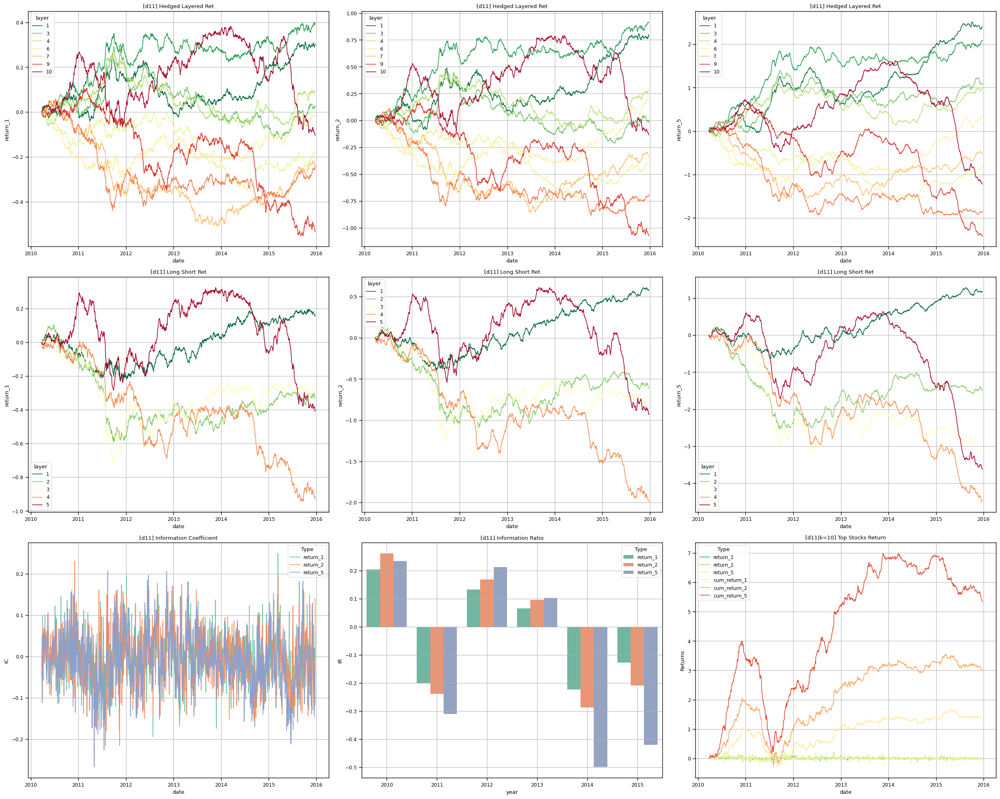

In [25]:
# Usage
analyzer = AlphaSignalAnalyzer(df_train_x[['d11']], factor_name="d11", price_data = df_train[['close_price']])
analyzer.run()

--------------------------------------------------
Running analysis...
Adding returns...
Calculating IC & IR...
Calculating layered return of return_1...
Calculating layered return of return_2...
Calculating layered return of return_5...
Backtesting top stocks...
Generating report...


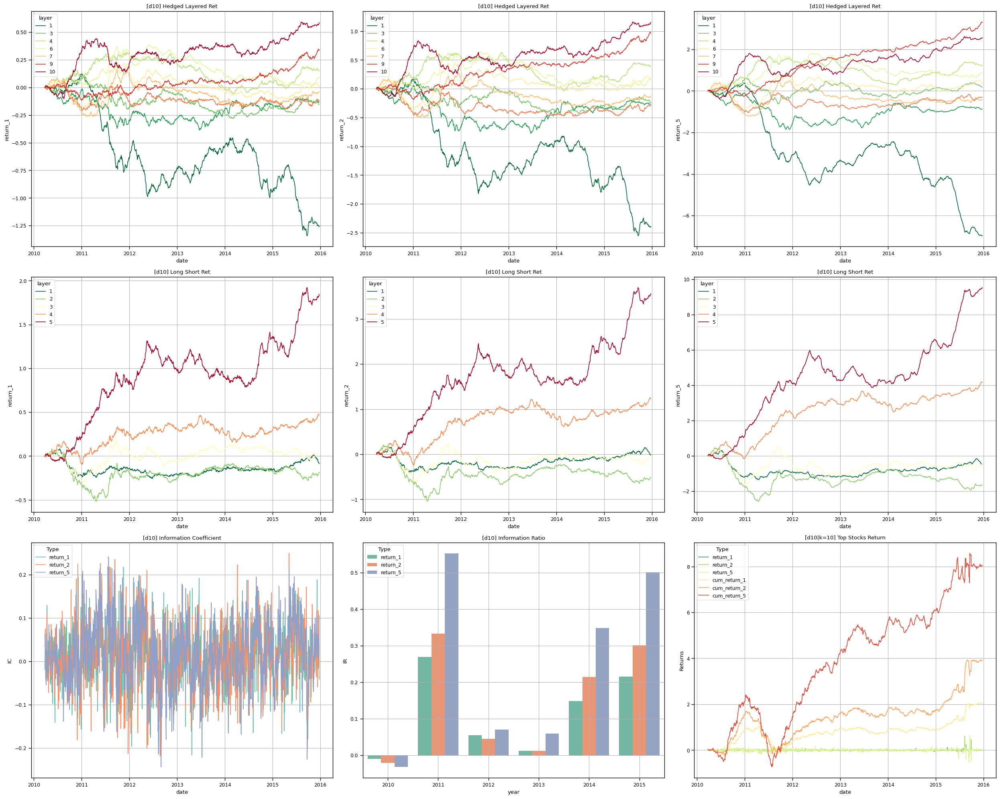

In [27]:
analyzer = AlphaSignalAnalyzer(-df_train_x[['d10']], factor_name="d10", price_data = df_train[['close_price']])
analyzer.run()

## XGBoost

In [28]:
seed = 2023
model_xgb_params= {
    'max_depth':3,
    'nthread':8,
    'objective':'reg:squarederror',
    'eta':0.025,
    'seed':seed,
 }

def pearson_ic(d_pred, d_train):
    d_label = d_train.get_label()
    ic = np.corrcoef(d_label,d_pred)[0][1]
    return 'ic', ic

In [29]:
dtrain = xgb.DMatrix(df_train_x.values, label=df_train_y.values)
dvalid = xgb.DMatrix(df_valid_x.values, label=df_valid_y.values)

In [31]:
model_xgb = xgb.train(
    model_xgb_params,
    dtrain,
    400,
    [(dtrain, 'dtrain'),(dvalid,'dvalid')],
    verbose_eval=20,
    feval=pearson_ic
)

[0]	dtrain-rmse:0.48833	dtrain-ic:0.05667	dvalid-rmse:0.48831	dvalid-ic:0.00225
[20]	dtrain-rmse:0.29526	dtrain-ic:0.06629	dvalid-rmse:0.29542	dvalid-ic:0.00250
[40]	dtrain-rmse:0.17952	dtrain-ic:0.07609	dvalid-rmse:0.17980	dvalid-ic:0.00206
[60]	dtrain-rmse:0.11076	dtrain-ic:0.08271	dvalid-rmse:0.11131	dvalid-ic:0.00284
[80]	dtrain-rmse:0.07083	dtrain-ic:0.08743	dvalid-rmse:0.07170	dvalid-ic:0.00356
[100]	dtrain-rmse:0.04882	dtrain-ic:0.09127	dvalid-rmse:0.05002	dvalid-ic:0.00384
[120]	dtrain-rmse:0.03776	dtrain-ic:0.09344	dvalid-rmse:0.04020	dvalid-ic:0.00364
[140]	dtrain-rmse:0.03284	dtrain-ic:0.09656	dvalid-rmse:0.03694	dvalid-ic:0.00383
[160]	dtrain-rmse:0.03085	dtrain-ic:0.09942	dvalid-rmse:0.03662	dvalid-ic:0.00407
[180]	dtrain-rmse:0.03009	dtrain-ic:0.10189	dvalid-rmse:0.03764	dvalid-ic:0.00416
[200]	dtrain-rmse:0.02981	dtrain-ic:0.10388	dvalid-rmse:0.03864	dvalid-ic:0.00430
[220]	dtrain-rmse:0.02970	dtrain-ic:0.10618	dvalid-rmse:0.03964	dvalid-ic:0.00438
[240]	dtrain-rmse:0.02

In [32]:
dtest = xgb.DMatrix(df_test_x)
se_pred=model_xgb.predict(dtest)
np.corrcoef(se_pred, df_test_y.values.flatten())

array([[1.        , 0.00494115],
       [0.00494115, 1.        ]])

In [33]:
result_xgb = pd.DataFrame(model_xgb.predict(xgb.DMatrix(df_train_x)), index=df_train_y.index, columns=["xgb_predict"])

In [34]:
np.corrcoef(result_xgb.values.flatten(), df_train_y.values.flatten())

array([[1.        , 0.12107177],
       [0.12107177, 1.        ]])

In [35]:
result_xgb

xgb_predict
data_date  security_id             
2010-03-26 147701          0.002634
           217101         -0.001174
           238801         -0.003329
           242701         -0.001976
           293801          0.002390
...                             ...
2015-12-31 1114970801      0.001295
           1115014801      0.000316
           1115019201      0.001389
           1115042501     -0.003824
           1115090101     -0.003204

[945781 rows x 1 columns]

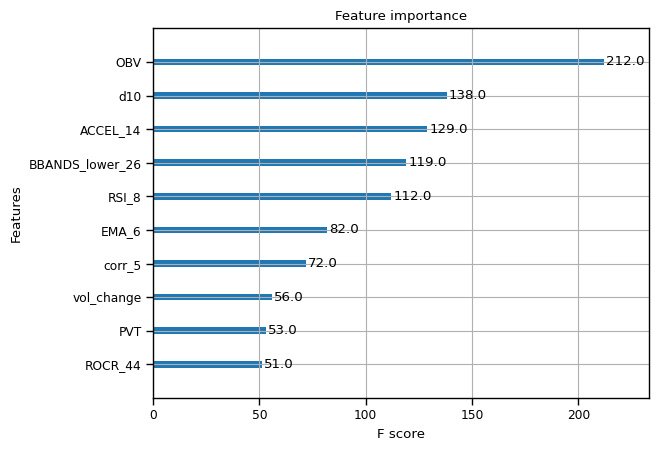

In [36]:
num_features = 10

# Get feature importance
f_importance_dict = model_xgb.get_score(importance_type='weight')

# Sort features based on importance
sorted_features = sorted(f_importance_dict.items(), key=lambda x: x[1], reverse=True)

# Select only the top features
top_features = dict(sorted_features[:num_features])

# Plot the importance for top features
xgb.plot_importance(top_features)
plt.show()


## XGBoost Performance in Train Set

--------------------------------------------------
Running analysis...
Adding returns...
Calculating IC & IR...
Calculating layered return of return_1...
Calculating layered return of return_2...
Calculating layered return of return_5...
Backtesting top stocks...
Generating report...


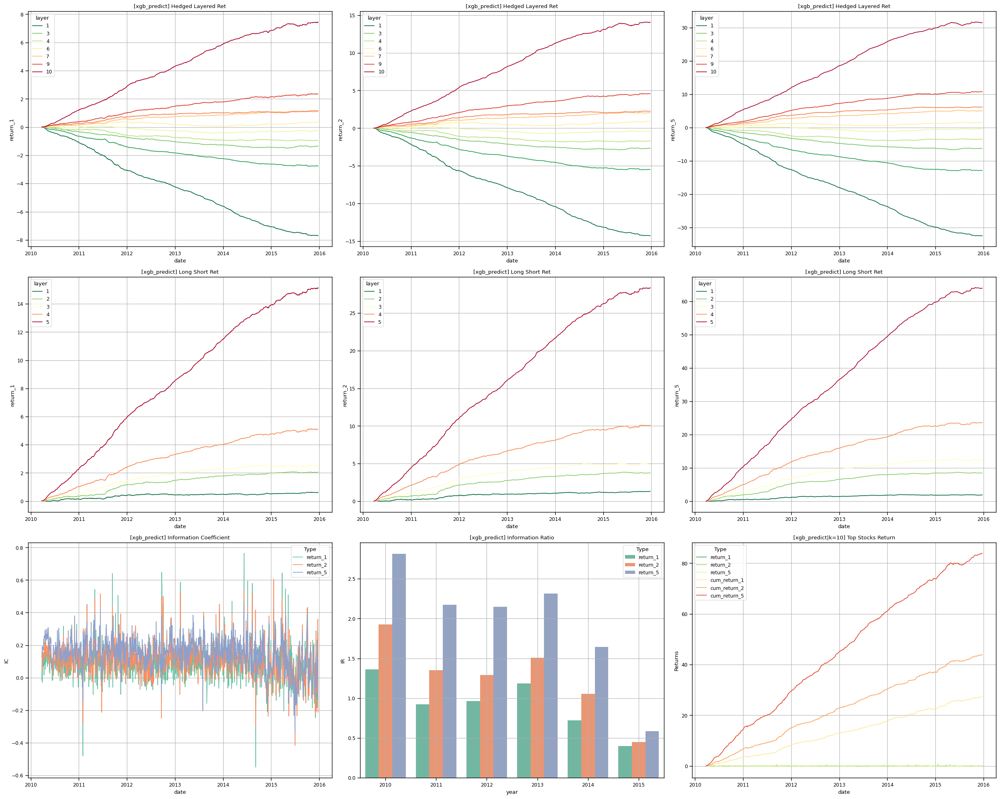

In [37]:
analyzer = AlphaSignalAnalyzer(result_xgb, factor_name="xgb_predict", price_data = df_train[['close_price']])
analyzer.run()

## XGBoost Performance in test set

--------------------------------------------------
Running analysis...
Adding returns...
Calculating IC & IR...
Calculating layered return of return_1...
Calculating layered return of return_2...
Calculating layered return of return_5...
Backtesting top stocks...
Generating report...


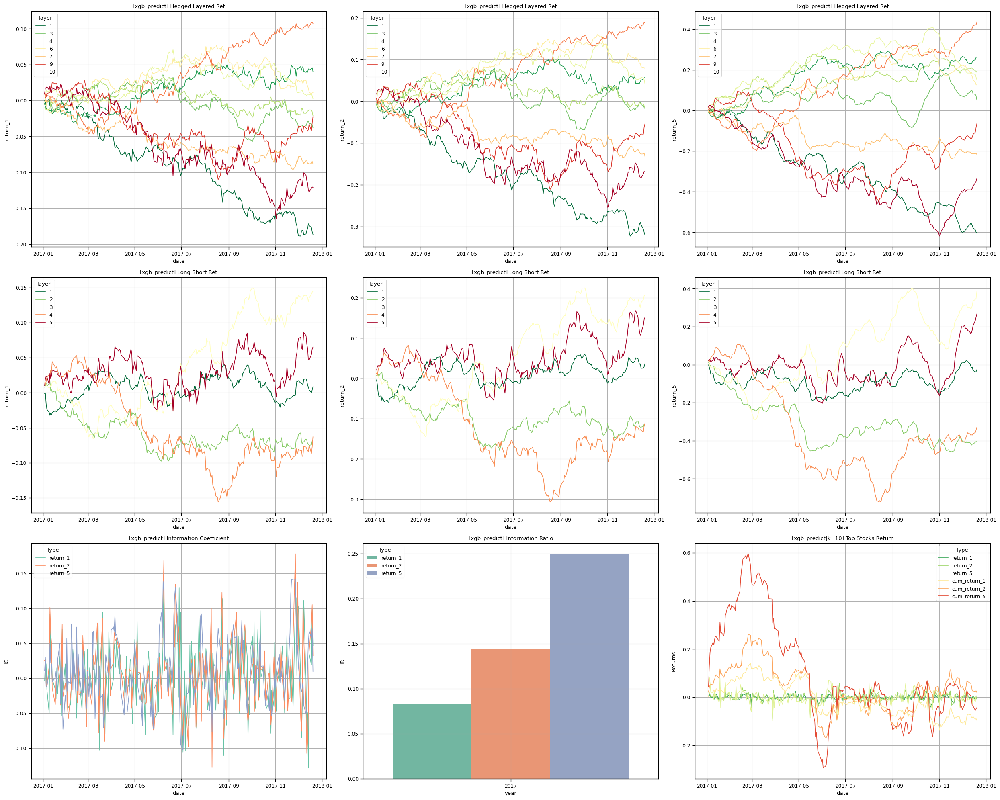

In [39]:
analyzer = AlphaSignalAnalyzer(pd.DataFrame(se_pred, index=df_test_y.index, columns=["xgb_predict"]), factor_name="xgb_predict", price_data = df_test[['close_price']])
analyzer.run()

In [40]:
model = LinearRegression()
model.fit(pd.concat([df_train_x,df_valid_x]),pd.concat([df_train_y,df_valid_y]))

LinearRegression()

In [41]:
a  = model.intercept_
b = model.coef_

## Linear Regression Performance in test set

--------------------------------------------------
Running analysis...
Adding returns...
Calculating IC & IR...
Calculating layered return of return_1...
Calculating layered return of return_2...
Calculating layered return of return_5...
Backtesting top stocks...
Generating report...


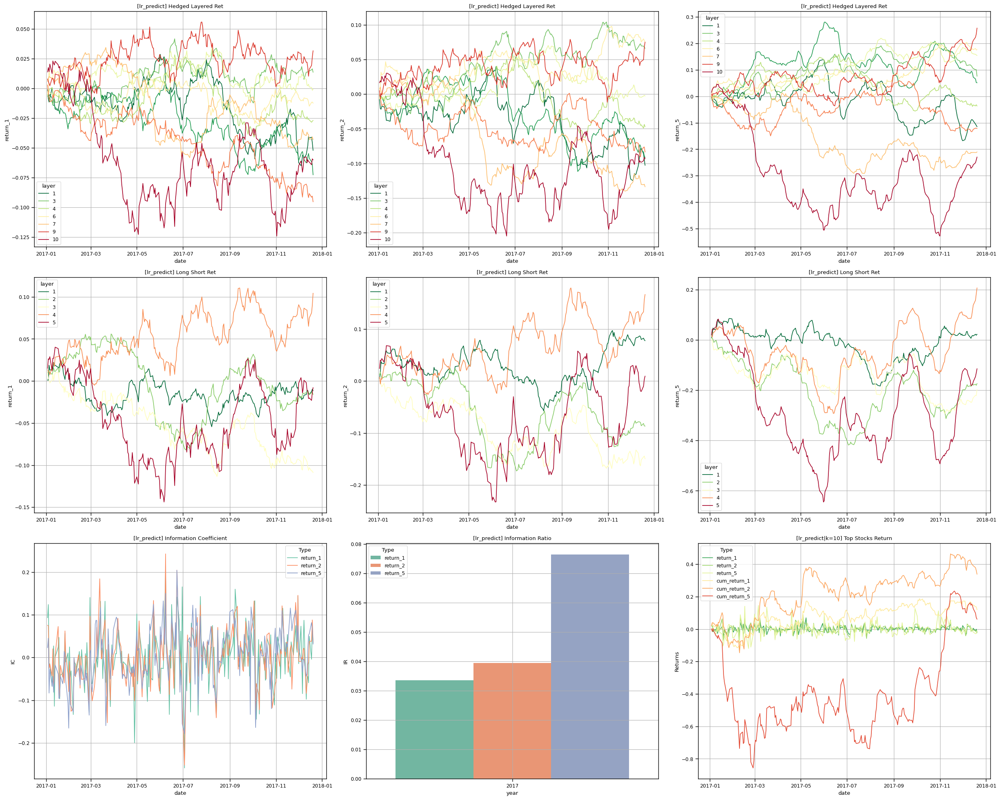

In [42]:
analyzer = AlphaSignalAnalyzer(pd.DataFrame(model.predict(df_test_x), index=df_test_y.index, columns=["lr_predict"]), factor_name="lr_predict", price_data = df_test[['close_price']])
analyzer.run()

In [67]:
lasso = Lasso(alpha=2e-4, max_iter=10000)
lasso.fit(pd.concat([df_train_x,df_valid_x]),pd.concat([df_train_y,df_valid_y]))

Lasso(alpha=0.0002, max_iter=10000)

In [68]:
lasso_predict = lasso.predict(df_test_x)

In [69]:
lasso_result = pd.DataFrame(data=lasso.coef_.tolist(),index=df_train_x.columns.tolist(),columns=['coef']).sort_values(by='coef', ascending=False)

In [70]:
lasso_result[lasso_result['coef']!=0]

,coef
vol_change,8.811401e-05
EMA_30,7.633829e-05
sd_15,1.790343e-05
d10,9.230566e-06
BBANDS_lower_14,6.326509e-06
d5,4.064636e-06
d6,3.434214e-06
volsd_15,1.219584e-06
VSMA_46,1.121822e-07
d11,-1.967449e-07


--------------------------------------------------
Running analysis...
Adding returns...
Calculating IC & IR...
Calculating layered return of return_1...
Calculating layered return of return_2...
Calculating layered return of return_5...
Backtesting top stocks...
Generating report...


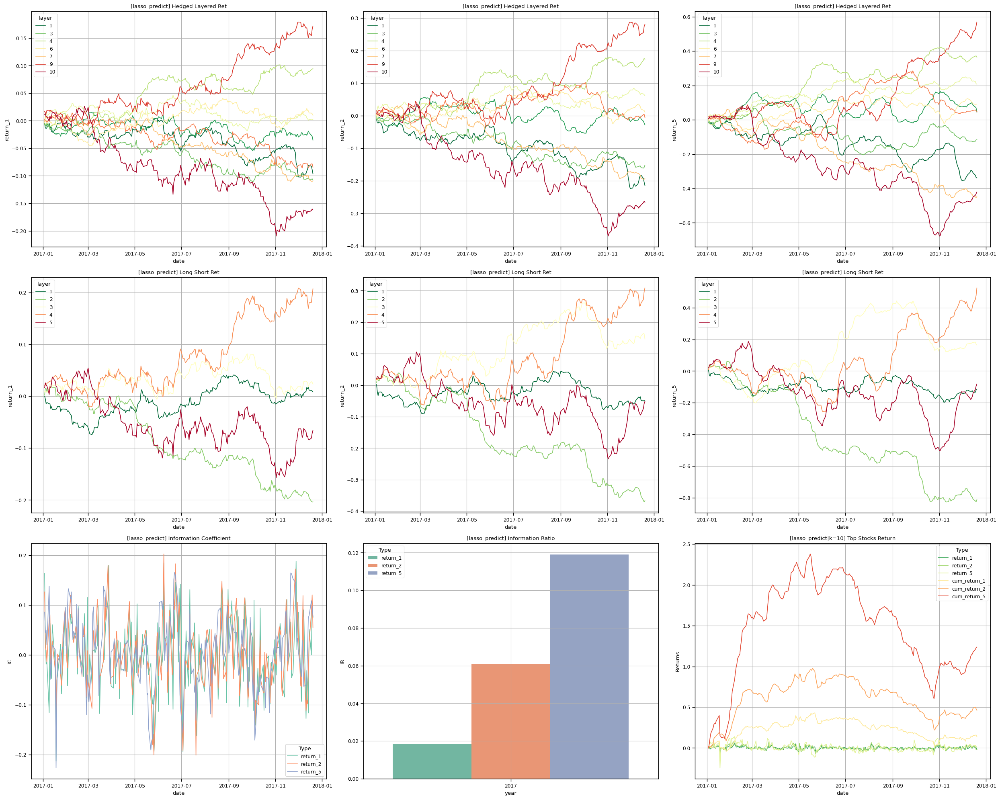

In [71]:
analyzer = AlphaSignalAnalyzer(pd.DataFrame(lasso_predict, index=df_test_y.index, columns=["lasso_predict"]), factor_name="lasso_predict", price_data = df_test[['close_price']])
analyzer.run()

In [73]:
selected_features = list(set(list(top_features.keys())) | set(lasso_result[lasso_result['coef']!=0].index))
selected_features

['vol_change',
 'ACCEL_14',
 'ROCR_44',
 'ROCR_56',
 'volsd_15',
 'PVT',
 'd5',
 'EMA_6',
 'd7',
 'BBANDS_lower_14',
 'BBANDS_lower_38',
 'd10',
 'd11',
 'd4',
 'd9',
 'ROCR_14',
 'corr_5',
 'd6',
 'VSMA_46',
 'BBANDS_upper_20',
 'EMA_50',
 'OBV',
 'ROCR_32',
 'sd_15',
 'BBANDS_upper_50',
 'EMA_30',
 'RSI_8',
 'BBANDS_lower_26',
 'VSMA_18']

In [63]:
dtrain = xgb.DMatrix(pd.concat([df_train_x,df_valid_x]).values, label=pd.concat([df_train_y,df_valid_y]).values)
model_xgb = xgb.train(
    model_xgb_params,
    dtrain,
    300,
    [(dtrain, 'dtrain')],
    verbose_eval=20,
    feval=pearson_ic
)
dtest = xgb.DMatrix(df_test_x)
se_pred=model_xgb.predict(dtest)
np.corrcoef(se_pred, df_test_y.values.flatten())

[0]	dtrain-rmse:0.48832	dtrain-ic:0.04026
[20]	dtrain-rmse:0.29527	dtrain-ic:0.05035
[40]	dtrain-rmse:0.17955	dtrain-ic:0.05849
[60]	dtrain-rmse:0.11081	dtrain-ic:0.06460
[80]	dtrain-rmse:0.07091	dtrain-ic:0.06938
[100]	dtrain-rmse:0.04894	dtrain-ic:0.07346
[120]	dtrain-rmse:0.03792	dtrain-ic:0.07670
[140]	dtrain-rmse:0.03301	dtrain-ic:0.08010
[160]	dtrain-rmse:0.03104	dtrain-ic:0.08323
[180]	dtrain-rmse:0.03029	dtrain-ic:0.08596
[200]	dtrain-rmse:0.03001	dtrain-ic:0.08860
[220]	dtrain-rmse:0.02990	dtrain-ic:0.09076
[240]	dtrain-rmse:0.02986	dtrain-ic:0.09275
[260]	dtrain-rmse:0.02984	dtrain-ic:0.09470
[280]	dtrain-rmse:0.02983	dtrain-ic:0.09645
[299]	dtrain-rmse:0.02983	dtrain-ic:0.09826


array([[1.        , 0.00476231],
       [0.00476231, 1.        ]])

--------------------------------------------------
Running analysis...
Adding returns...
Calculating IC & IR...
Calculating layered return of return_1...
Calculating layered return of return_2...
Calculating layered return of return_5...
Backtesting top stocks...
Generating report...


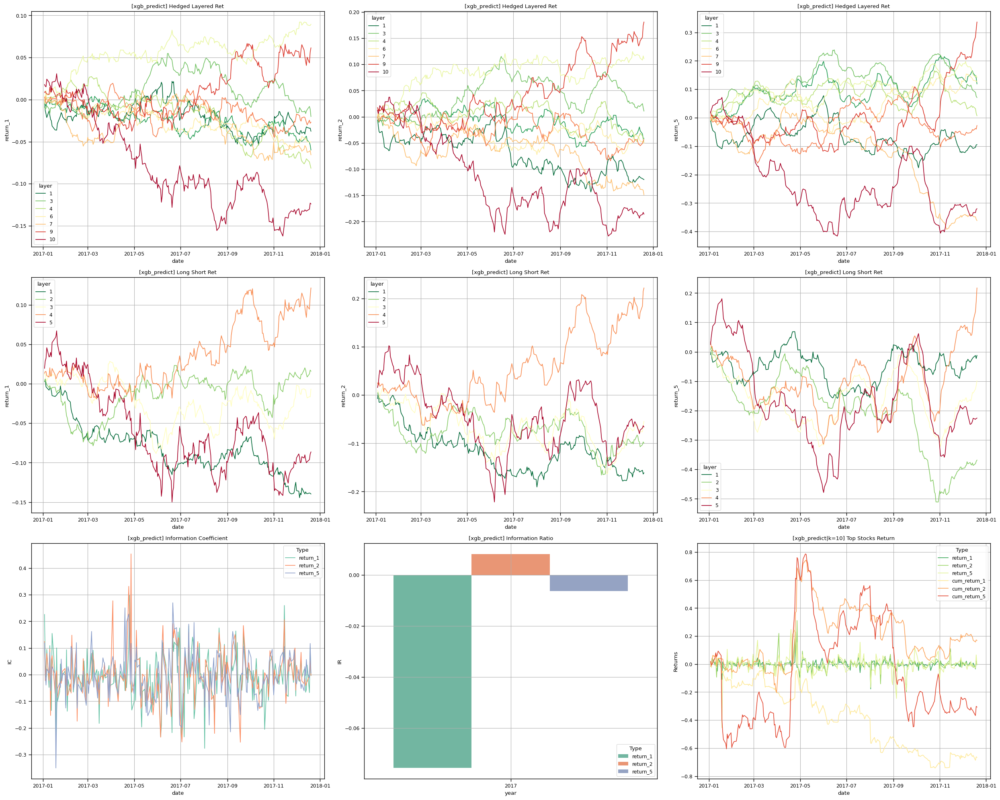

In [64]:
analyzer = AlphaSignalAnalyzer(pd.DataFrame(se_pred, index=df_test_y.index, columns=["xgb_predict"]), factor_name="xgb_predict", price_data = df_test[['close_price']])
analyzer.run()

In [82]:
model = Sequential()
model.add(layers.Dense(128, activation='relu',input_dim=(29)))
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(1))
    
# Change an optimizers' learning rate
adam = keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=adam, loss='mean_squared_error')
    
# Train 10 times
history = model.fit(df_train_x[selected_features], df_train_y, 
          epochs=10, batch_size=256,validation_data=(df_valid_x[selected_features], df_valid_y), shuffle=False)

Epoch 1/10
3695/3695 [==============================] - 22s 6ms/step - loss: 0.0083 - val_loss: 800.0776
Epoch 2/10
3695/3695 [==============================] - 21s 6ms/step - loss: 0.0014 - val_loss: 185.2686
Epoch 3/10
3695/3695 [==============================] - 21s 6ms/step - loss: 9.6995e-04 - val_loss: 76.3203
Epoch 4/10
3695/3695 [==============================] - 21s 6ms/step - loss: 9.1526e-04 - val_loss: 34.7804
Epoch 5/10
3695/3695 [==============================] - 21s 6ms/step - loss: 9.0076e-04 - val_loss: 21.3324
Epoch 6/10
3695/3695 [==============================] - 21s 6ms/step - loss: 8.9442e-04 - val_loss: 17.7946
Epoch 7/10
3695/3695 [==============================] - 21s 6ms/step - loss: 8.8831e-04 - val_loss: 12.1807
Epoch 8/10
3695/3695 [==============================] - 20s 5ms/step - loss: 8.8493e-04 - val_loss: 8.6257
Epoch 9/10
3695/3695 [==============================] - 21s 6ms/step - loss: 8.8392e-04 - val_loss: 7.2783
Epoch 10/10
3695/3695 [=============

In [83]:
true = df_test_y
predict = pd.DataFrame(model.predict(df_test_x[selected_features]), 
                       index=df_test_x.index, columns=['DNN_predict'])
df_pre = pd.concat([true,predict], axis=1)

5137/5137 [==============================] - 10s 2ms/step


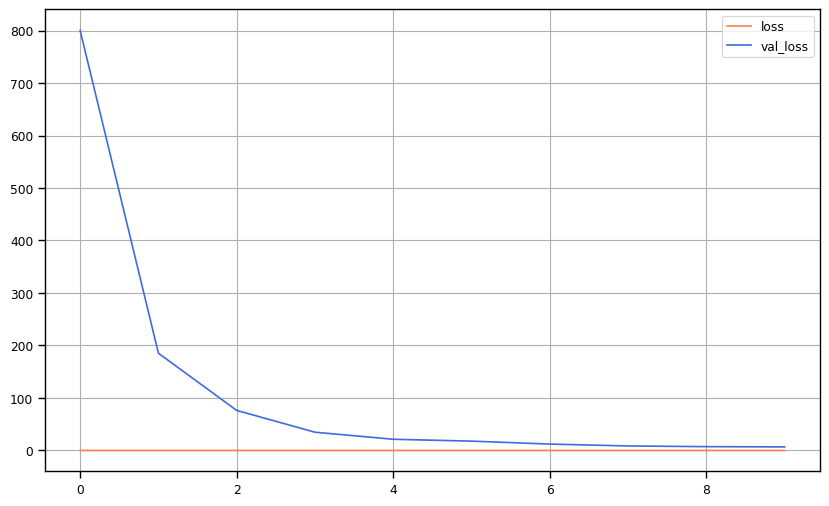

In [84]:
# Make pictures to observe result
fig1 = plt.figure(figsize=(10,6))
plt.plot(history.history['loss'], color='coral', label='loss')
plt.plot(history.history['val_loss'], color='royalblue', label='val_loss')
plt.legend()
plt.grid(True)

--------------------------------------------------
Running analysis...
Adding returns...
Calculating IC & IR...
Calculating layered return of return_1...
Calculating layered return of return_2...
Calculating layered return of return_5...
Backtesting top stocks...
Generating report...


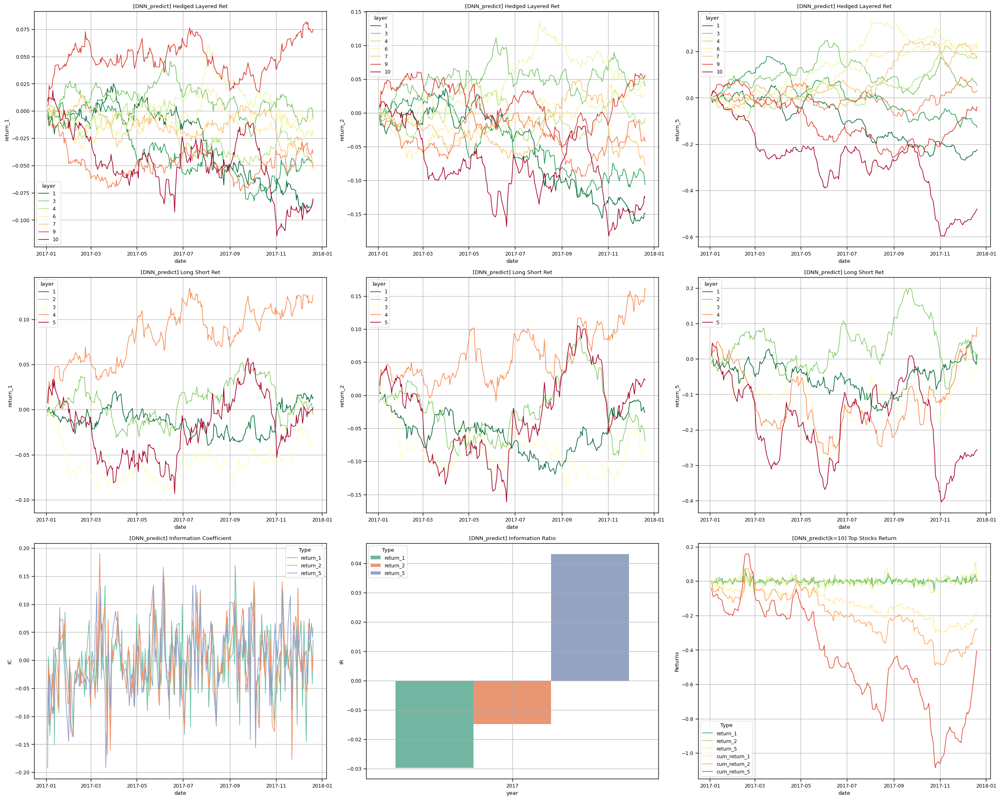

In [ ]:
analyzer = AlphaSignalAnalyzer(predict, factor_name="DNN_predict", price_data = df_test[['close_price']])
analyzer.run()

In [91]:
x_train = np.reshape(df_train_x, (df_train_x.shape[0], df_train_x.shape[1], 1))
y_train = np.array(df_train_y)

x_valid = np.reshape(df_valid_x, (df_valid_x.shape[0], df_valid_x.shape[1], 1))
y_valid = np.array(df_valid_y)


def LSTM_model():
    
    model = Sequential()
    
    model.add(LSTM(units = 100, return_sequences = True, input_shape = (x_train.shape[1],1)))
    model.add(Dropout(0.2))

    model.add(LSTM(units = 100))
    model.add(Dropout(0.2))
    
    model.add(Dense(units=1))
    
    return model

model = LSTM_model()
model.summary()
model.compile(optimizer='adam', 
              loss='mean_squared_error')

checkpointer = ModelCheckpoint(filepath = 'weights_best.hdf5', 
                               verbose = 2, 
                               save_best_only = True)

model.fit(x_train, 
          y_train, 
          epochs=10, 
          batch_size = 256,
          validation_data=(x_valid, y_valid),
          callbacks = [checkpointer])

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 115, 100)          40800     
                                                                 
 dropout_9 (Dropout)         (None, 115, 100)          0         
                                                                 
 lstm_7 (LSTM)               (None, 100)               80400     
                                                                 
 dropout_10 (Dropout)        (None, 100)               0         
                                                                 
 dense_51 (Dense)            (None, 1)                 101       
                                                                 
Total params: 121,301
Trainable params: 121,301
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
3695/3695 [=========================

In [92]:
y_test = np.array(df_test_y)
x_test = np.reshape(df_test_x, (df_test_x.shape[0], df_test_x.shape[1] ,1))

price_pred_lstm = model.predict(x_test)

5137/5137 [==============================] - 56s 11ms/step


In [94]:
lstm_predict = pd.DataFrame(price_pred_lstm, index=df_test_x.index, columns=['LSTM_predict'])

--------------------------------------------------
Running analysis...
Adding returns...
Calculating IC & IR...
Calculating layered return of return_1...
Calculating layered return of return_2...
Calculating layered return of return_5...
Backtesting top stocks...
Generating report...


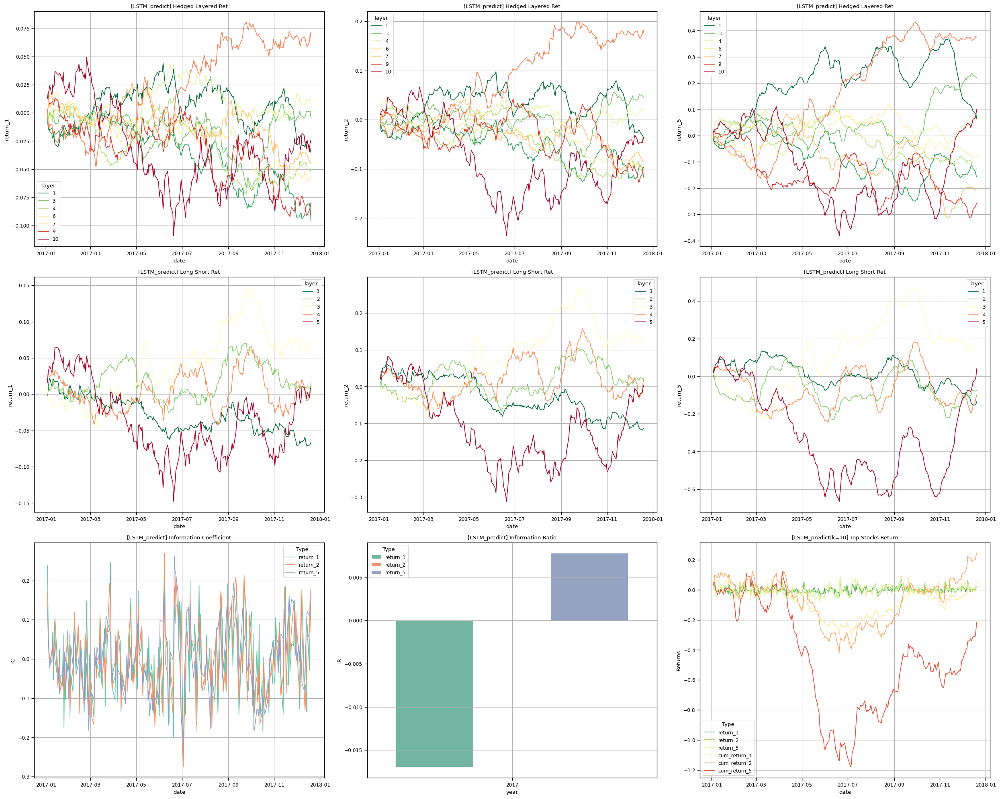

In [95]:
analyzer = AlphaSignalAnalyzer(lstm_predict, factor_name="LSTM_predict", price_data = df_test[['close_price']])
analyzer.run()

In [64]:
model = Sequential()
model.add(LSTM(128, return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(64, return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(1, activation='linear'))

optimizer = Adam(lr=0.0001)
model.compile(loss='mean_squared_error', optimizer=optimizer)

X_train_LSTM ,Y_train_LSTM = convert_data_shape(df_train_x,df_train_y)
X_valid_LSTM ,Y_valid_LSTM = convert_data_shape(df_valid_x,df_valid_y)

history = model.fit(X_train_LSTM ,Y_train_LSTM, 
          epochs=10, validation_data=(X_valid_LSTM ,Y_valid_LSTM),shuffle=False)

Epoch 1/10
46/46 [==============================] - 17s 337ms/step - loss: 5.4736e-04 - val_loss: 3.7430e-04
Epoch 2/10
46/46 [==============================] - 15s 318ms/step - loss: 4.2516e-04 - val_loss: 3.7475e-04
Epoch 3/10
46/46 [==============================] - 15s 322ms/step - loss: 4.5614e-04 - val_loss: 3.6044e-04
Epoch 4/10
46/46 [==============================] - 14s 313ms/step - loss: 4.2903e-04 - val_loss: 3.6073e-04
Epoch 5/10
46/46 [==============================] - 14s 315ms/step - loss: 3.8417e-04 - val_loss: 3.6042e-04
Epoch 6/10
46/46 [==============================] - 14s 311ms/step - loss: 3.5530e-04 - val_loss: 3.6045e-04
Epoch 7/10
46/46 [==============================] - 14s 314ms/step - loss: 3.4253e-04 - val_loss: 3.6053e-04
Epoch 8/10
46/46 [==============================] - 14s 311ms/step - loss: 3.3842e-04 - val_loss: 3.6064e-04
Epoch 9/10
46/46 [==============================] - 14s 311ms/step - loss: 3.3856e-04 - val_loss: 3.6066e-04
Epoch 10/10
46/46 [

In [267]:
class PortfolioManager:
    def __init__(self, predictions,history, all_df, trading_cost_rate=0.0001, top_n=10):
        self.predictions = predictions
        self.predictions.index.names = ['date','id']
        self.history = history
        self.history.index.names = ['date','id']
        self.all_df = all_df
        self.trading_cost_rate = trading_cost_rate
        self.top_n = top_n
        self.portfolio_value = {'Portfolio': [100000000]}
        self.current_positions = pd.Series(index=self.predictions.columns)
        self.turnovers = []
        self.positions = pd.DataFrame(index = predictions.index.levels[0],columns=['long','short'])
        self.long_returns = []
        self.short_returns = []
        
    def Portfolio_volatility(self, weights, mean_returns,cov_matrix):
        """
        Calculate the expected portfolio volatility.
        """
        return np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights)))

    def determine_weights(self, returns):
        """
        Determine the optimal weights for the portfolio assets using the Mean-Variance Optimization.
        """
        mean_returns = returns.mean()
        cov_matrix = returns.cov()

        num_assets = len(mean_returns)

        args = (mean_returns, cov_matrix)
        constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
        bound = (0, 0.1)  # Set the maximum weight for any asset
        bounds = tuple(bound for asset in range(num_assets))

        result = sco.minimize(self.Portfolio_volatility, num_assets * [1. / num_assets], args=args, method='SLSQP', bounds=bounds, constraints=constraints)
        weights = result['x']
        return weights

    def _update_turnover(self, new_positions):
        if self.current_positions.dropna().empty:
            turnover = 0
        else:
            turnover = (self.current_positions.fillna(0) - new_positions.fillna(0)).abs().sum() / 2
        self.turnovers.append(turnover)

    def calculate_portfolio(self):
        
        for date, preds in self.predictions.groupby('date'):
            # Filter stocks in the trading universe
            preds = preds.droplevel(0)
            tradable_stocks = self.all_df[self.all_df['in_trading_universe'] == 'Y'].loc[date].index
            tradable_stocks = list(set(tradable_stocks) & set(preds.index))
            if len(tradable_stocks)<2*self.top_n:
                top_n = len(tradable_stocks)//2
            else:
                top_n = self.top_n

            # Get top and bottom stocks
            long_stocks = preds.loc[tradable_stocks].nlargest(top_n,columns=preds.columns).index.tolist()
            short_stocks = preds.loc[tradable_stocks].nsmallest(top_n,columns=preds.columns).index.tolist()
            
            long_his_returns = self.history.swaplevel().loc[long_stocks].unstack().T.droplevel(0)
            short_his_returns = self.history.swaplevel().loc[short_stocks].unstack().T.droplevel(0)
            
            weights_long = self.determine_weights(long_his_returns)
            weights_short = self.determine_weights(short_his_returns)

            # Determine position size per stock
            position_size = self.portfolio_value['Portfolio'][-1] / 2  # Divided by 2 because we're allocating half to longs and half to shorts

            # Get returns for these stocks the next day
            long_returns = self.all_df.loc[date].loc[long_stocks]['tmr_ret1d']
            short_returns = self.all_df.loc[date].loc[short_stocks]['tmr_ret1d']
            
            long_price = self.all_df.loc[date].loc[long_stocks]['close_price']
            short_price = self.all_df.loc[date].loc[short_stocks]['close_price']

            # Calculate portfolio return and update value
            daily_return = ((long_returns*weights_long).sum() - (short_returns*weights_short).sum()) / 2  # Average return of longs minus shorts
            self.long_returns.append((long_returns*weights_long).sum())
            self.short_returns.append((short_returns*weights_short).sum())
            
            # Update turnover and current positions
            new_positions = pd.Series(index= preds.index)
            new_positions[long_stocks] = position_size / sum(weights_long*long_price)
            new_positions[short_stocks] = -position_size / sum(weights_short*short_price)
            
            self._update_turnover(new_positions)
            trading_cost = self.turnovers[-1] * self.trading_cost_rate  # Cost for both buying and selling
            daily_return -= trading_cost/self.portfolio_value['Portfolio'][-1]
            self.portfolio_value['Portfolio'].append(self.portfolio_value['Portfolio'][-1] * (1 + daily_return))

            
            self.positions.loc[date]['long'] = long_stocks
            self.positions.loc[date]['short'] = short_stocks
            self.current_positions = new_positions
                
    def calculate_sharpe_ratio(self):
        returns = pd.Series(self.portfolio_value['Portfolio']).pct_change().dropna()
        sharpe_ratio = returns.mean() / returns.std()
        return sharpe_ratio

    def plot_result(self):
        plt.figure(figsize=(12, 8))
        
        # Portfolio Value
        plt.subplot(2, 2, 1)
        plt.plot(self.portfolio_value['Portfolio'], label="Portfolio Value")
        plt.title('PnL Curve')
        plt.xlabel('Date')
        plt.ylabel('Portfolio Value')
        plt.legend()
        plt.grid(True)
        
        # Portfolio Cumulative Return
        plt.subplot(2, 2, 2)
        returns = pd.Series(self.portfolio_value['Portfolio']).pct_change().cumsum()
        plt.plot(returns, label="Cumulative Returns")
        plt.title('Cumulative Returns over Time')
        plt.xlabel('Date')
        plt.ylabel('Cumulative Return (%)')
        plt.legend()
        plt.grid(True)
        
        # Turnover
        plt.subplot(2, 2, 3)
        plt.plot(self.turnovers)
        plt.title('Portfolio Turnover over Time')
        plt.xlabel('Date')
        plt.ylabel('Turnover')
        plt.grid(True)
        
        
        # Long Short Return
        plt.subplot(2, 2, 4)
        plt.plot(np.cumprod(1 + np.array(self.long_returns)), label='Long Cumulative Return')
        plt.plot(np.cumprod(1 + np.array(self.short_returns)), label='Short Cumulative Return')
        plt.xlabel('Date')
        plt.ylabel('Return')
        plt.title('Long and Short Cumulative Return')
        plt.legend()
        plt.grid(True)
        
        
        plt.tight_layout()
        plt.show()

        
    def annualized_return(self):
        total_return = self.portfolio_value['Portfolio'][-1] / self.portfolio_value['Portfolio'][0] - 1
        years = len(self.portfolio_value['Portfolio']) / 252  # Assuming 252 trading days in a year
        annualized_return = (1 + total_return) ** (1/years) - 1
        return annualized_return

    def max_drawdown(self):
        returns = np.array(self.portfolio_value['Portfolio'])
        running_max = pd.Series(returns).cummax().values
        drawdowns = (running_max - returns) / running_max
        return drawdowns.max()

    def position_overview(self):
        long_positions = len(self.current_positions[self.current_positions == 1])
        short_positions = len(self.current_positions[self.current_positions == -1])
        
        print(f"Long Positions: {long_positions}")
        print(f"Short Positions: {short_positions}")

    def summary(self):
        print("Portfolio Summary")
        print("------------------")
        print(f"Sharpe Ratio: {self.calculate_sharpe_ratio():.3f}")
        print(f"Annualized Return: {self.annualized_return():.3f}")
        print(f"Maximum Drawdown: {self.max_drawdown():.3f}")
        self.position_overview()


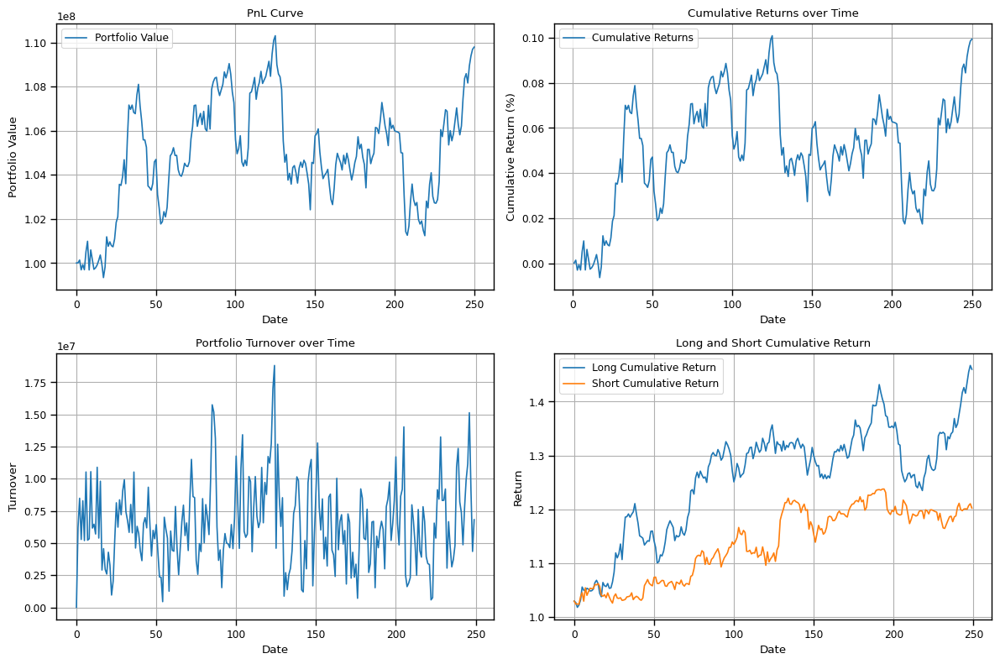

Portfolio Summary
------------------
Sharpe Ratio: 0.057
Annualized Return: 0.098
Maximum Drawdown: 0.082
Long Positions: 0
Short Positions: 0


In [268]:
portfolio_manager = PortfolioManager(pd.DataFrame(lasso_predict, index=df_test_y.index, columns=["lasso_predict"]),df_train_y, all_df)
portfolio_manager.calculate_portfolio()
portfolio_manager.plot_result()
portfolio_manager.summary()

In [269]:
portfolio_manager.positions.dropna()

,long,short
date,,
2017-01-03,"[1113781601, 4987001, 1114957601, 1114730501, ...","[1031, 1113549401, 1112873801, 1114389401, 111..."
2017-01-04,"[1113781601, 4987001, 1107428301, 1114957601, ...","[9081801, 1031, 1112873801, 1114945501, 111354..."
2017-01-05,"[1113781601, 4987001, 1113657901, 1114957601, ...","[1031, 1113549401, 1114945501, 1114389401, 111..."
2017-01-06,"[1113781601, 4987001, 1114957601, 1098779601, ...","[9081801, 1031, 1111194501, 1113549401, 111438..."
2017-01-09,"[1113781601, 4987001, 1104448101, 1114957601, ...","[9081801, 1031, 1111194501, 1113549401, 111494..."
...,...,...
2017-12-21,"[1112873801, 4987001, 1111082401, 2354101, 111...","[1115019201, 1113678701, 1113963301, 9081801, ..."
2017-12-22,"[1112873801, 4987001, 1110858201, 1111070401, ...","[1113769101, 1115019201, 1113678701, 111396330..."
2017-12-26,"[4987001, 1111082401, 1110858201, 1111070401, ...","[1113769101, 1107516301, 1115019201, 111367870..."


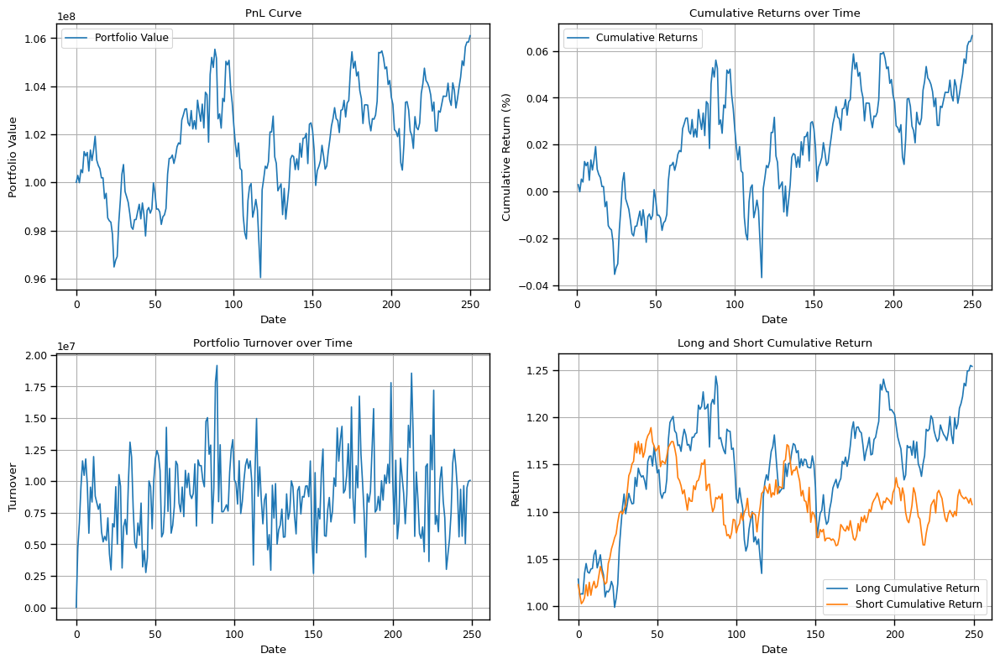

Portfolio Summary
------------------
Sharpe Ratio: 0.035
Annualized Return: 0.061
Maximum Drawdown: 0.090
Long Positions: 0
Short Positions: 0


In [271]:
portfolio_manager = PortfolioManager(pd.DataFrame(se_pred, index=df_test_y.index, columns=["xgb_predict"]),df_train_y, all_df)
portfolio_manager.calculate_portfolio()
portfolio_manager.plot_result()
portfolio_manager.summary()

In [272]:
portfolio_manager.positions.dropna()

,long,short
date,,
2017-01-03,"[1110450101, 1114970801, 1113678701, 111378160...","[1112873801, 238801, 5116501, 4022201, 3175110..."
2017-01-04,"[1110450101, 1114970801, 944201, 1102467201, 6...","[1111194501, 1112873801, 1114079001, 238801, 1..."
2017-01-05,"[1110450101, 1114970801, 1102467201, 111427510...","[1112873801, 1111205401, 238801, 5116501, 1388..."
2017-01-06,"[1114970801, 1110450101, 944201, 1113678701, 1...","[1111194501, 238801, 5116501, 1111205401, 4022..."
2017-01-09,"[217101, 1114970801, 944201, 1615501, 11136787...","[1112873801, 238801, 1388001, 5116501, 1102659..."
...,...,...
2017-12-21,"[4987001, 1112873801, 1104448101, 1113003901, ...","[1113678701, 1098994901, 1388001, 238801, 1111..."
2017-12-22,"[4987001, 1112873801, 1104448101, 1113769101, ...","[299601, 2504001, 238801, 1098994901, 3981401,..."
2017-12-26,"[4987001, 1113003901, 1103594701, 1114929401, ...","[1388001, 5325901, 238801, 1098994901, 996501,..."
